# Image Captioning on the Flicker8k Dataset

This notebook provides you with a rough structure for the Mini-Challenge on the topic of Image Captioning from the Deep Learning MSE course. Please make sure to follow the Project Setup steps to ensure reproducable results. Additionally familiarize yourself with the grading structure and project submission guidelines in the _DL-MPW-ImgCaptioning.pdf_ document. There you'll find all the information you should need.

If you have any questions please contact roman.studer@fhnw.ch

###  Team Name and Members
<span style="color: red;"><strong>Jonathan Muller and Mouni Sattenapally</span>


### Some Guidelines

- You are allowed to use generative models (e.g. ChatGPT, Claude etc.) for code completion or suggestions. However, we require you to perfectly understand and control the code.
- You are **not** allowed to use the same or similar generative models for providing reflection on the achieved results. __You__ must reflect about what you see and build your own opinion about it.
- You are allowed to create additional python scripts to outsource code snippets to improve readability.

### Upload files from locally

In [ ]:
from google.colab import files
uploaded = files.upload()   # select dataloader.py and other repo files


Saving archive.zip to archive.zip


In [ ]:
# create the folder first
!mkdir -p ./data/images
!mkdir -p ./data/splits

# then unzip into it
!unzip archive.zip -d ./data/images



Archive:  archive.zip
replace ./data/images/Images/1000268201_693b08cb0e.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

### Upload files from google drive
This expects a folder named "DeepLearningProject3" in the drive containing the "data" folder zipped and the "dataloader.py" and "tokenizer.py" files

In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("adityajn105/flickr8k")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'flickr8k' dataset.
Path to dataset files: /kaggle/input/flickr8k


In [3]:
from google.colab import drive
from pathlib import Path

drive.mount('/content/drive')

if not Path("/data/splits").exists():
  !unzip -q "/content/drive/MyDrive/DeepLearningProject3/data.zip" -d ./

!mkdir -p ./data/images
!cp -rf "/kaggle/input/flickr8k/Images"/* "./data/images/"

!cp "/content/drive/MyDrive/DeepLearningProject3/dataloader.py" .
!cp "/content/drive/MyDrive/DeepLearningProject3/tokenizer.py" .

Mounted at /content/drive


## Project Setup


### 1. Create the virtual environment

Create a new environment and install the necessary dependencies listed in `requirements.txt`. Make sure you can import the libraries in the code cell below and that yout pytorch installation can run on your GPU.

In [4]:
# imports
import textwrap

import matplotlib.pyplot as plt
from PIL import Image
import torch
import torchvision
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision.models import ResNet18_Weights
import torch.optim as optim
from torchvision import transforms

from dataloader import (
    build_tokenizer_from_split,
    create_caption_dataloader
)
from tokenizer import tokenize

print("torch version:", torch.__version__)
print("torchvision version:", torchvision.__version__)

import json
from google.colab import files

torch version: 2.11.0+cu128
torchvision version: 0.26.0+cu128


### 2. Download the dataset
The Flickr8k dataset used in this challenge is available under [Flickr 8k Dataset - Kaggle](https://www.kaggle.com/datasets/adityajn105/flickr8k). In the zip folder on Moodle you find the basic structure with `captions.txt` and the `data/splits`-folder, but without images in the `data/ìmages`-folder. Make sure to download all the images and placing them in the folder `data/images/`.
The train test split is already provided for you and handled by the provided `dataloader.py` script. Test and train split image lists and corresponding captions are located in the `data/splits/` folder. Don't modify this split.

<img src="data_structure.png"/>

## Dataloader, Tokenizer

The repository includes a `Dataset`-class (`Flickr8kCaptionsDatasetBase`) and `DataLoader`'s that are based on this specific structure of the data directory. You can use `create_caption_dataloader` for obtaining instances for the train and test data loaders. You can configure it with the `tokenizer` provided in the repo. The `tokenizer` performs some preprocessing steps of the captions. It also creates a vocabulary from the training data and then provides a mapping from the words to tokens. Note that there are also some special tokens introduced that are important when processing the captions during training or generating the captions during inference:
| Word    | ID | Role |
| --------| ---|----- |
| `<pad>`  | 0 | padding for filling up sequence to a given length in a mini-batch. |
| `<bos>`  | 1 | beginning of sentence - each tokenized sentence should start with `<bos>`, i.e. also the generated ones. |
| `<eos>`  | 2 | end of sentence - for fixed length captions will signal that the rest will consist of `<pad>`-tokens only. |
| `<unk>`  | 3 | unknown - not available in vocabulary |

Furthermore, specify your transforms used for preprocessing and augmenting the images and pass them to the `create_caption_dataloader`-method.
The mini-batches created by the dataloader have the following structure: `(images, captions, lengths, image_ids, raw_captions)`. Captions are built from the training vocabulary only, and `lengths` may let you mask padding tokens in the loss.


In [6]:
# Transforms
IMAGENET_SIZE = 224
IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD = (0.229, 0.224, 0.225)

def _convert_to_rgb(image: Image.Image) -> Image.Image:
    return image.convert("RGB")

def build_train_transforms() -> transforms.Compose:
    return transforms.Compose([
            transforms.Lambda(_convert_to_rgb),
            transforms.Resize((256, 256)),              # resize slightly larger
            transforms.RandomCrop(IMAGENET_SIZE),       # crop to 224×224
            transforms.RandomHorizontalFlip(),          # augmentation
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
            transforms.ToTensor(),
            transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)])

def build_test_transforms() -> transforms.Compose:
    return transforms.Compose([
            transforms.Lambda(_convert_to_rgb),
            transforms.Resize((IMAGENET_SIZE,IMAGENET_SIZE)),
            transforms.ToTensor(),
            transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)])

def denormalize_image(image: torch.Tensor) -> torch.Tensor:
    """Undo ImageNet normalization for visualization."""
    mean_tensor = image.new_tensor(IMAGENET_MEAN).view(-1, 1, 1)
    std_tensor = image.new_tensor(IMAGENET_STD).view(-1, 1, 1)
    return (image * std_tensor + mean_tensor).clamp(0, 1)

For image preprocessing, we used separate transforms for training and testing. Training images are converted to RGB, resized, randomly cropped to 224×224, randomly flipped, color-jittered, converted to tensors, and normalized with ImageNet statistics. Test images use a deterministic pipeline: RGB conversion, resizing to 224×224, tensor conversion, and ImageNet normalization.

In [7]:
data_dir = "/content/data"

MIN_WORD_FREQ = 5
MAX_LEN = 40
BATCH_SIZE = 32

In [8]:
tokenizer = build_tokenizer_from_split(split="train", data_dir = data_dir, min_freq=MIN_WORD_FREQ)

train_loader = create_caption_dataloader(
    split="train",
    data_dir = data_dir,
    tokenizer=tokenizer,
    transform = build_train_transforms(),
    batch_size = BATCH_SIZE,
    max_len=MAX_LEN,
    caption_sampling="all")
test_loader = create_caption_dataloader(
    split="test",
    data_dir = data_dir,
    tokenizer=tokenizer,
    transform = build_test_transforms(),
    batch_size = BATCH_SIZE,
    max_len=MAX_LEN,
    caption_sampling="random")


print(f"Total images: {len(train_loader.dataset) + len(test_loader.dataset)}")


images, captions, lengths, image_ids, raw_captions = next(iter(train_loader))

print(f"Vocabulary size: {len(tokenizer):,}")
print(f"Training Images: {len(train_loader.dataset):,}")
print(f"Batch image tensor shape: {tuple(images.shape)}")
print(f"Batch caption tensor shape: {tuple(captions.shape)}")
print(f"Caption lengths in first batch: {lengths.tolist()}")

images, captions, lengths, image_ids, raw_captions = next(iter(test_loader))

print(f"Testing Images: {len(test_loader.dataset):,}")
print(f"Batch image tensor shape: {tuple(images.shape)}")
print(f"Batch caption tensor shape: {tuple(captions.shape)}")
print(f"Caption lengths in first batch: {lengths.tolist()}")


Total images: 33983
Vocabulary size: 2,649
Training Images: 32,365
Batch image tensor shape: (32, 3, 224, 224)
Batch caption tensor shape: (32, 40)
Caption lengths in first batch: [7, 10, 12, 15, 14, 9, 9, 14, 12, 9, 12, 8, 14, 10, 12, 10, 16, 14, 12, 8, 11, 18, 12, 13, 13, 11, 13, 9, 15, 12, 18, 9]
Testing Images: 1,618
Batch image tensor shape: (32, 3, 224, 224)
Batch caption tensor shape: (32, 40)
Caption lengths in first batch: [21, 20, 12, 17, 12, 18, 10, 12, 13, 11, 18, 7, 12, 28, 13, 10, 8, 10, 14, 12, 12, 8, 7, 11, 12, 15, 10, 17, 15, 11, 10, 16]


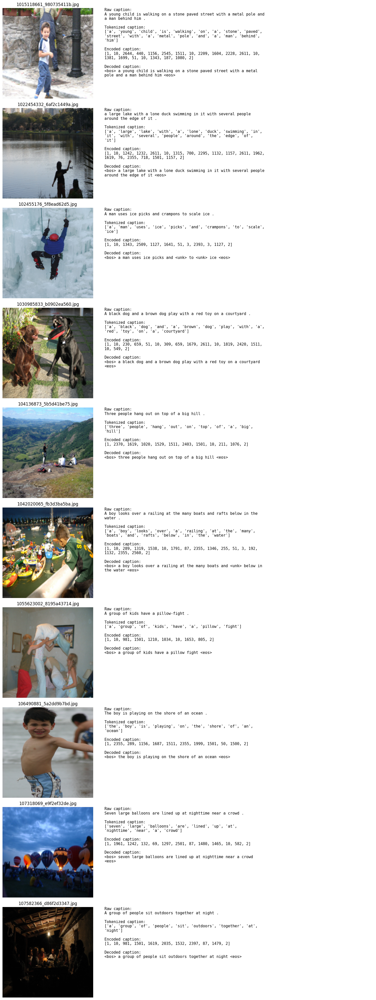

In [9]:
num_examples = 10
n = min(num_examples, len(images))

fig, axes = plt.subplots(
    nrows=n,
    ncols=2,
    figsize=(16, 4 * n),
    gridspec_kw={"width_ratios": [1.1, 2.2]},
)

if n == 1:
    axes = [axes]

for idx in range(n):
    image = denormalize_image(images[idx].detach().cpu()).permute(1, 2, 0)

    encoded_caption = captions[idx, : int(lengths[idx])].tolist()
    tokenized_caption = tokenize(raw_captions[idx])
    decoded_caption = tokenizer.decode(encoded_caption, skip_special_tokens=False)

    ax_image, ax_text = axes[idx]
    ax_image.imshow(image)
    ax_image.set_title(image_ids[idx])
    ax_image.axis("off")

    caption_details = "\n\n".join(
        [
            f"Raw caption:\n{textwrap.fill(raw_captions[idx], width=70)}",
            f"Tokenized caption:\n{textwrap.fill(str(tokenized_caption), width=70)}",
            f"Encoded caption:\n{textwrap.fill(str(encoded_caption), width=70)}",
            f"Decoded caption:\n{textwrap.fill(decoded_caption, width=70)}",
        ]
    )

    ax_text.axis("off")
    ax_text.text(
        0,
        1,
        caption_details,
        va="top",
        ha="left",
        fontsize=11,
        family="monospace",
    )

plt.tight_layout()
plt.show()

## Shared Utilities

Use this section for shared config and helper functions reused across all experiments. For example define a common training loop, BLEU computation or visualization helpers here. This way your model models stay directly comparable.


In [10]:
DEVICE = None
if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
elif torch.backends.mps.is_available():
    DEVICE = torch.device("mps")
else:
    DEVICE = torch.device("cpu")

print("device:", DEVICE)

device: cuda


Training and Evaluation

In [12]:
def word_accuracy(outputs, targets):
    pad_idx = 0
    mask = (targets != pad_idx)
    predicted = outputs.argmax(dim=-1)
    correct = (predicted == targets) & mask
    return correct.sum().item() / mask.sum().item() if mask.sum().item() > 0 else 0.0

def train_one_epoch(model, encoder, dataloader, criterion, optimizer, device):
    model.train()
    total_loss, total_acc = 0, 0
    for images, captions, _, _, _ in dataloader:
        images, captions = images.to(device), captions.to(device)

        optimizer.zero_grad()
        encoder_out = encoder(images)
        outputs = model(encoder_out, captions)   # (B, seq_len or seq_len-1, vocab_size)
        targets = captions[:, 1:].contiguous()   # (B, seq_len-1)

        if outputs.size(1) != targets.size(1):
            outputs = outputs[:, :targets.size(1), :]

        loss = criterion(outputs.reshape(-1, outputs.size(-1)), targets.reshape(-1))
        acc = word_accuracy(outputs, targets)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_acc += acc
    return total_loss / len(dataloader), total_acc / len(dataloader)


def evaluate_one_epoch(model, encoder, dataloader, criterion, device, tokenizer):
    model.eval()
    total_loss, total_acc = 0, 0
    hypotheses, references = [], []
    with torch.no_grad():
        for images, captions, _, _, raw_caps in dataloader:
            images, captions = images.to(device), captions.to(device)
            encoder_out = encoder(images)
            outputs = model(encoder_out, captions)
            targets = captions[:, 1:].contiguous()

            if outputs.size(1) != targets.size(1):
                outputs = outputs[:, :targets.size(1), :]

            loss = criterion(outputs.reshape(-1, outputs.size(-1)), targets.reshape(-1))
            acc = word_accuracy(outputs, targets)

            total_loss += loss.item()
            total_acc += acc

            preds = model.generate(
                encoder_out,
                max_len=captions.size(1),
                bos_idx=tokenizer.bos_idx,
                eos_idx=tokenizer.eos_idx,
            )
            for pred in preds:
                hypotheses.append(tokenizer.decode(pred).split())
            references.extend([[ref.split()] for ref in raw_caps])
    return total_loss / len(dataloader), total_acc / len(dataloader), hypotheses, references

from nltk.translate.bleu_score import corpus_bleu
def compute_bleu(references, hypotheses):
    return {
        "BLEU-1": corpus_bleu(references, hypotheses, weights=(1, 0, 0, 0)),
        "BLEU-2": corpus_bleu(references, hypotheses, weights=(0.5, 0.5, 0, 0)),
        "BLEU-3": corpus_bleu(references, hypotheses, weights=(0.33, 0.33, 0.33, 0)),
        "BLEU-4": corpus_bleu(references, hypotheses, weights=(0.25, 0.25, 0.25, 0.25)),
    }

def show_image_with_caption(image_tensor, caption, tokenizer):
    image = denormalize_image(image_tensor.cpu())
    plt.imshow(image.permute(1, 2, 0))
    plt.title(tokenizer.decode(caption))
    plt.axis("off")
    plt.show()


## Model 1 - Show and Tell

Implement the model described in the [_Show and Tell_](https://arxiv.org/abs/1411.4555) paper . Record the training behavior, inspect a few generated captions on held-out images, and report BLEU on your fixed evaluation subset.

In [13]:
ENCODER_DIM = 512      # ResNet18 output
EMBED_DIM = 256        # word embedding size
DECODER_DIM = 512      # LSTM hidden size
DROPOUT = 0.5          # dropout rate
FREEZE_ENCODER = True  # freeze CNN encoder initially


In [14]:
class ShowAndTellEncoder(nn.Module):
    def __init__(self, encoder_dim=ENCODER_DIM, freeze_encoder=FREEZE_ENCODER):
        super().__init__()
        resnet = models.resnet18(pretrained=True)
        modules = list(resnet.children())[:-1]   # remove final FC
        self.cnn = nn.Sequential(*modules)

        if freeze_encoder:
            for p in self.cnn.parameters():
                p.requires_grad = False

        self.encoder_dim = encoder_dim
    def forward(self, images: torch.Tensor) -> torch.Tensor:
        features = self.cnn(images)              # (batch, 512, 1, 1)
        features = features.view(features.size(0), -1)  # (batch, 512)
        return features

class ShowAndTellCaptioner(nn.Module):
    def __init__(self, vocab_size, encoder_dim=ENCODER_DIM, embed_dim=EMBED_DIM,
                 decoder_dim=DECODER_DIM, dropout=DROPOUT):
        super().__init__()
        self.embed = nn.Embedding(vocab_size, embed_dim)
        self.lstm = nn.LSTM(embed_dim + encoder_dim, decoder_dim, batch_first=True)
        self.fc = nn.Linear(decoder_dim, vocab_size)
        self.dropout = nn.Dropout(dropout)

    def forward(self, encoder_out: torch.Tensor, captions: torch.Tensor) -> torch.Tensor:
        # encoder_out: (batch, encoder_dim)
        # captions are expected to include <bos> and <eos> tokens.
        captions_input = captions[:, :-1]
        encoder_out = encoder_out.unsqueeze(1)  # (batch, 1, encoder_dim)
        embeddings = self.embed(captions_input)  # (batch, seq_len-1, embed_dim)
        inputs = torch.cat([encoder_out.expand(-1, embeddings.size(1), -1), embeddings], dim=-1)
        outputs, _ = self.lstm(inputs)
        outputs = self.dropout(outputs)
        logits = self.fc(outputs)          # (batch, seq_len-1, vocab_size)
        return logits

    @torch.no_grad()
    def generate(self, encoder_out: torch.Tensor, max_len=35, bos_idx=None, eos_idx=None):
        self.eval()
        batch_size = encoder_out.size(0)
        if bos_idx is None:
            bos_idx = tokenizer.bos_idx
        if eos_idx is None:
            eos_idx = tokenizer.eos_idx

        hidden = None
        bos_tokens = torch.tensor([bos_idx] * batch_size, device=encoder_out.device)
        inputs = torch.cat([encoder_out, self.embed(bos_tokens)], dim=-1).unsqueeze(1)
        captions = [[] for _ in range(batch_size)]

        for _ in range(max_len):
            outputs, hidden = self.lstm(inputs, hidden)
            outputs = self.fc(outputs.squeeze(1))  # (batch, vocab_size)
            predicted = outputs.argmax(dim=-1)     # greedy choice

            for i, p in enumerate(predicted.tolist()):
                captions[i].append(p)

            # stop if all EOS
            if all(p == eos_idx for p in predicted.tolist()):
                break

            inputs = torch.cat([encoder_out, self.embed(predicted)], dim=-1).unsqueeze(1)
        return captions

In [15]:
# Initialize encoder + captioner
encoder = ShowAndTellEncoder(encoder_dim=ENCODER_DIM, freeze_encoder=FREEZE_ENCODER).to(DEVICE)
captioner = ShowAndTellCaptioner(
    vocab_size=len(tokenizer),
    encoder_dim=ENCODER_DIM,
    embed_dim=EMBED_DIM,
    decoder_dim=DECODER_DIM,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_idx)
optimizer = optim.Adam(captioner.parameters(), lr=1e-3)
NUM_EPOCHS = 10
train_losses, val_losses, train_accs, val_accs, bleu_scores = [], [], [], [], []

for epoch in range(NUM_EPOCHS):
    train_loss, train_acc = train_one_epoch(captioner, encoder, train_loader, criterion, optimizer, DEVICE)
    val_loss, val_acc, hyps, refs = evaluate_one_epoch(captioner, encoder, test_loader, criterion, DEVICE, tokenizer)
    bleu = compute_bleu(refs, hyps)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)
    bleu_scores.append(bleu)

    print(f"Epoch {epoch+1}/{NUM_EPOCHS}")
    print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
    print(f"Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f}")
    print("BLEU:", bleu)




/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 228MB/s]


Epoch 1/10
Train Loss: 3.8388 | Val Loss: 3.2373
Train Acc: 0.3039 | Val Acc: 0.3522
BLEU: {'BLEU-1': 0.1729424083769633, 'BLEU-2': 0.08273807125021215, 'BLEU-3': 0.041098596636470294, 'BLEU-4': 0.019758321840399135}
Epoch 2/10
Train Loss: 3.1880 | Val Loss: 3.0423
Train Acc: 0.3571 | Val Acc: 0.3739
BLEU: {'BLEU-1': 0.21268750947017526, 'BLEU-2': 0.10756234337456222, 'BLEU-3': 0.05737846854209851, 'BLEU-4': 0.02851038168209173}
Epoch 3/10
Train Loss: 2.9774 | Val Loss: 2.9552
Train Acc: 0.3744 | Val Acc: 0.3837
BLEU: {'BLEU-1': 0.18992061055309445, 'BLEU-2': 0.09744527797632496, 'BLEU-3': 0.05302510200795915, 'BLEU-4': 0.027924457634359547}
Epoch 4/10
Train Loss: 2.8502 | Val Loss: 2.9103
Train Acc: 0.3856 | Val Acc: 0.3866
BLEU: {'BLEU-1': 0.22398783281947965, 'BLEU-2': 0.11818904645120444, 'BLEU-3': 0.0670980447658704, 'BLEU-4': 0.03730445902881366}
Epoch 5/10
Train Loss: 2.7568 | Val Loss: 2.8480
Train Acc: 0.3948 | Val Acc: 0.3967
BLEU: {'BLEU-1': 0.22525976039140133, 'BLEU-2': 0.

In [16]:
images, captions, lengths, _, raw_caps = next(iter(test_loader))
images = images.to(DEVICE)
encoder_out = encoder(images)

# Generate captions
generated = captioner.generate(encoder_out, max_len=MAX_LEN)

# Show a few examples
for i in range(3):
    print("Reference:", raw_caps[i])
    print("Generated:", tokenizer.decode(generated[i]))
    print("---")


Reference: A boy smiles in front of a stony wall in a city .
Generated: a man in a blue shirt is standing on a bench
---
Reference: A little boy at a lake watching a duck .
Generated: a man in a black shirt is standing on a pier near a lake
---
Reference: A man uses ice picks and crampons to scale ice .
Generated: a child in a red jacket is snowboarding
---


The code below allows mantaining the results even after restarting the environment without the need of retraining the model that takes a lot of time

In [17]:
results = {
    "model_1": {
        "train_loss": train_losses,
        "val_loss": val_losses,
        "train_acc": train_accs,
        "val_acc": val_accs,
        "bleu_scores": bleu_scores
    }
}

with open("captioning_results_m1.json", "w") as f:
    json.dump(results, f, indent=4)

files.download("captioning_results_m1.json")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [20]:
with open("captioning_results_m1.json", "r") as f:
    results = json.load(f)

train_losses = results["model_1"]["train_loss"]
val_losses = results["model_1"]["val_loss"]
train_accs = results["model_1"]["train_acc"]
val_accs = results["model_1"]["val_acc"]
bleu_scores = results["model_1"]["bleu_scores"]

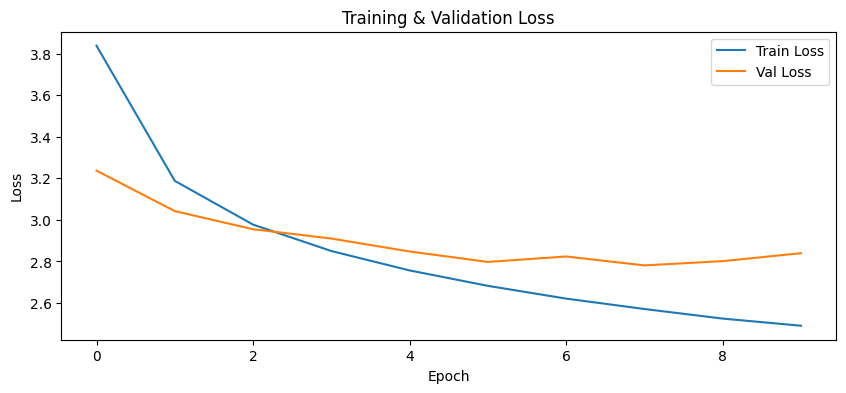

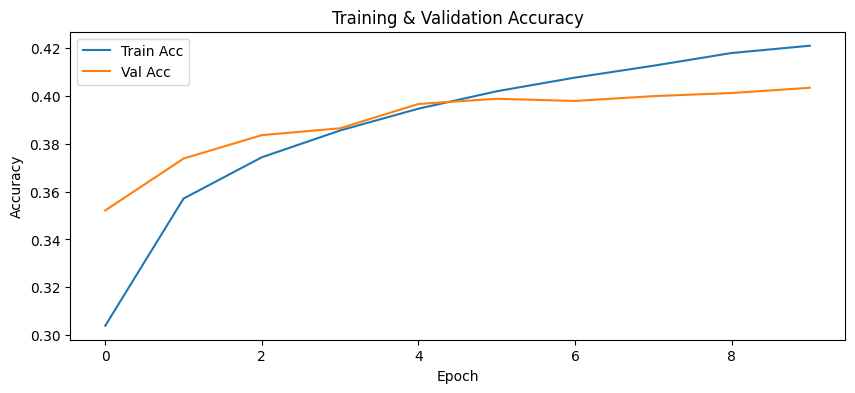

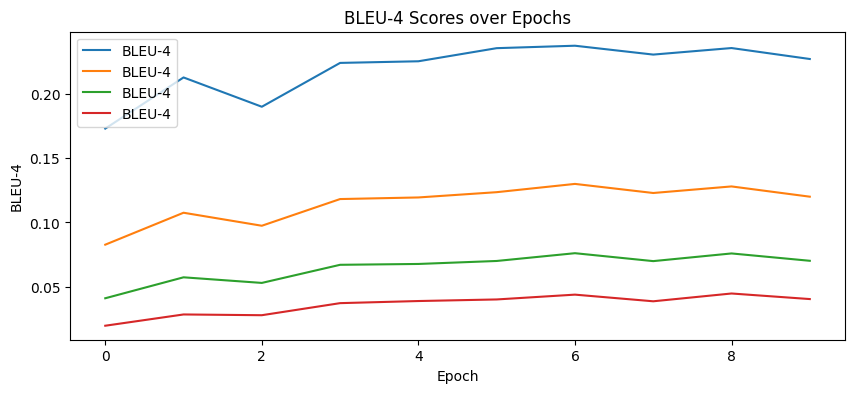

In [21]:
# Loss curves
plt.figure(figsize=(10,4))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")
plt.xlabel("Epoch"); plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend(); plt.show()

# Accuracy curves
plt.figure(figsize=(10,4))
plt.plot(train_accs, label="Train Acc")
plt.plot(val_accs, label="Val Acc")
plt.xlabel("Epoch"); plt.ylabel("Accuracy")
plt.title("Training & Validation Accuracy")
plt.legend(); plt.show()

# BLEU curves (example BLEU-4)
bleu1 = [b["BLEU-1"] for b in bleu_scores]
bleu2 = [b["BLEU-2"] for b in bleu_scores]
bleu3 = [b["BLEU-3"] for b in bleu_scores]
bleu4 = [b["BLEU-4"] for b in bleu_scores]
plt.figure(figsize=(10,4))
plt.plot(bleu1, label="BLEU-4")
plt.plot(bleu2, label="BLEU-4")
plt.plot(bleu3, label="BLEU-4")
plt.plot(bleu4, label="BLEU-4")
plt.xlabel("Epoch"); plt.ylabel("BLEU-4")
plt.title("BLEU-4 Scores over Epochs")
plt.legend(); plt.show()



Briefly summarize what happened during training, which captions looked convincing or weak, and what the BLEU score does or does not capture for this model.


<span style="color: red;"><strong></strong> </span>

Model 1 used a ResNet‑18 encoder with the final fully connected layer removed, producing 512‑dimensional features, and an LSTM decoder with 256‑dim word embeddings and 512 hidden units.

Training ran for 10 epochs with dropout 0.5 and Adam at 0.001. Losses dropped steadily (train from 3.8 → 2.48, validation from 3.2 → ~2.81), while accuracy rose to ~42% on training and ~40% on validation, showing the model learned word patterns and sentence structure.
BLEU‑1 to BLEU‑4 scores improved modestly, with BLEU‑1 around 0.23 and BLEU‑4 close to 0.04, reflecting limited overlap with reference captions.
Captions are grammatically correct and fluent but often generic, defaulting to “a man…” and failing to capture specific details like the duck.

Overall, the model trained smoothly and produced plausible sentences, but its main limitation was weak grounding in the image content and low semantic accuracy.

We doubt that further training with these hyperparameters would improve the results to much as looking at the graphs makes us think that it will probably go into overfitting.

## Model 2 - Show, Attend and Tell

Now implement the continuation of the Show and Tell paper. An attention-based captioning model described in the paper [_Show, Attend and Tell_](https://arxiv.org/abs/1502.03044). Use the same test data subset and BLEU setup as before, then compare how attention changes the training behavior and generated captions.


In [22]:
ENCODER_DIM = 512       # ResNet18 feature channels
EMBED_DIM = 256         # word embedding size
DECODER_DIM = 512       # LSTM hidden size
DROPOUT = 0.5           # dropout rate
FREEZE_ENCODER = True   # freeze CNN encoder initially
ATTENTION_DIM = 256     # attention linear layer size


In [23]:
class ShowAttendTellEncoder(nn.Module):
    def __init__(self, encoder_dim=512, freeze=True):
        super().__init__()
        resnet = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        modules = list(resnet.children())[:-2]  # remove avgpool + fc
        self.cnn = nn.Sequential(*modules)
        if freeze:
            for p in self.cnn.parameters():
                p.requires_grad = False
        self.encoder_dim = encoder_dim

    def forward(self, images: torch.Tensor):
        features = self.cnn(images)              # (B, 512, H/32, W/32)
        B, C, H, W = features.size()
        features = features.view(B, C, -1).permute(0, 2, 1)  # (B, num_pixels, encoder_dim)
        return features

class AdditiveAttention(nn.Module):

    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super().__init__()
        self.enc_att = nn.Linear(encoder_dim, attention_dim)
        self.dec_att = nn.Linear(decoder_dim, attention_dim)
        self.full_att = nn.Linear(attention_dim, 1)

    def forward(self, encoder_out: torch.Tensor, decoder_hidden: torch.Tensor):
      att1 = self.enc_att(encoder_out)                  # (B, num_pixels, att_dim)
      att2 = self.dec_att(decoder_hidden).unsqueeze(1) # (B, 1, att_dim)
      att = torch.tanh(att1 + att2)
      scores = self.full_att(att).squeeze(2)           # (B, num_pixels)
      alpha = F.softmax(scores, dim=1)                 # attention weights
      context = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)  # (B, encoder_dim)
      return context, alpha


class ShowAttendTellCaptioner(nn.Module):
    def __init__(self, vocab_size, embed_dim=256, decoder_dim=512,
                 encoder_dim=512, attention_dim=256, dropout=0.5):
        super().__init__()
        self.embed = nn.Embedding(vocab_size, embed_dim)
        self.attention = AdditiveAttention(encoder_dim, decoder_dim, attention_dim)
        self.lstm = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim)
        self.fc = nn.Linear(decoder_dim, vocab_size)
        self.dropout = nn.Dropout(dropout)

    def forward(self, encoder_out: torch.Tensor, captions: torch.Tensor):
        batch_size = encoder_out.size(0)
        seq_len = captions.size(1)

        hidden = torch.zeros(batch_size, self.lstm.hidden_size).to(encoder_out.device)
        cell   = torch.zeros(batch_size, self.lstm.hidden_size).to(encoder_out.device)

        outputs = []
        for t in range(seq_len):
            emb = self.embed(captions[:, t])
            context, _ = self.attention(encoder_out, hidden)
            lstm_input = torch.cat([emb, context], dim=1)
            hidden, cell = self.lstm(lstm_input, (hidden, cell))
            out = self.fc(self.dropout(hidden))
            outputs.append(out.unsqueeze(1))
        return torch.cat(outputs, dim=1)  # (B, seq_len, vocab_size)

    @torch.no_grad()
    def generate(self, encoder_out: torch.Tensor, max_len=35, bos_idx=1, eos_idx=2):
        batch_size = encoder_out.size(0)
        hidden = torch.zeros(batch_size, self.lstm.hidden_size).to(encoder_out.device)
        cell   = torch.zeros(batch_size, self.lstm.hidden_size).to(encoder_out.device)

        inputs = torch.tensor([bos_idx]*batch_size).to(encoder_out.device)
        captions = [[] for _ in range(batch_size)]

        for _ in range(max_len):
            emb = self.embed(inputs)
            context, _ = self.attention(encoder_out, hidden)
            lstm_input = torch.cat([emb, context], dim=1)
            hidden, cell = self.lstm(lstm_input, (hidden, cell))
            out = self.fc(hidden)
            predicted = out.argmax(dim=1)

            for i, p in enumerate(predicted.tolist()):
                captions[i].append(p)

            inputs = predicted
            if all(p == eos_idx for p in predicted.tolist()):
                break
        return captions

In [25]:
# Encoder backbone (ResNet features)
encoder2 = ShowAttendTellEncoder(encoder_dim=ENCODER_DIM, freeze=FREEZE_ENCODER).to(DEVICE)

# Attention-based captioner
captioner2 = ShowAttendTellCaptioner(
    vocab_size=len(tokenizer),
    embed_dim=EMBED_DIM,
    decoder_dim=DECODER_DIM,
    encoder_dim=ENCODER_DIM,
    attention_dim=ATTENTION_DIM,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_idx)
optimizer = optim.Adam(captioner2.parameters(), lr=1e-3)

NUM_EPOCHS = 10
train_losses2, val_losses2, train_accs2, val_accs2, bleu_scores2 = [], [], [], [], []

for epoch in range(NUM_EPOCHS):
    train_loss, train_acc = train_one_epoch(captioner2, encoder2, train_loader, criterion, optimizer, DEVICE)
    val_loss, val_acc, hyps, refs = evaluate_one_epoch(captioner2, encoder2, test_loader, criterion, DEVICE, tokenizer)
    bleu = compute_bleu(refs, hyps)

    train_losses2.append(train_loss)
    val_losses2.append(val_loss)
    train_accs2.append(train_acc)
    val_accs2.append(val_acc)
    bleu_scores2.append(bleu)

    print(f"Epoch {epoch+1}/{NUM_EPOCHS}")
    print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
    print(f"Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f}")
    print("BLEU:", bleu)


Epoch 1/10
Train Loss: 3.7477 | Val Loss: 3.1785
Train Acc: 0.3130 | Val Acc: 0.3591
BLEU: {'BLEU-1': 0.16817440912795437, 'BLEU-2': 0.08130478330003481, 'BLEU-3': 0.04181393004753464, 'BLEU-4': 0.021964387943880705}
Epoch 2/10
Train Loss: 3.0970 | Val Loss: 2.9771
Train Acc: 0.3673 | Val Acc: 0.3818
BLEU: {'BLEU-1': 0.21036007580543273, 'BLEU-2': 0.10658620968578866, 'BLEU-3': 0.05669306511897232, 'BLEU-4': 0.029259648696759816}
Epoch 3/10
Train Loss: 2.8834 | Val Loss: 2.8890
Train Acc: 0.3854 | Val Acc: 0.3887
BLEU: {'BLEU-1': 0.23135657076385088, 'BLEU-2': 0.12021874343098421, 'BLEU-3': 0.06831053708713626, 'BLEU-4': 0.038657083376138185}
Epoch 4/10
Train Loss: 2.7548 | Val Loss: 2.8063
Train Acc: 0.3974 | Val Acc: 0.3945
BLEU: {'BLEU-1': 0.2207986254121774, 'BLEU-2': 0.11349101696837763, 'BLEU-3': 0.06295692705529805, 'BLEU-4': 0.03524492271540547}
Epoch 5/10
Train Loss: 2.6508 | Val Loss: 2.8087
Train Acc: 0.4082 | Val Acc: 0.4030
BLEU: {'BLEU-1': 0.23650911277225933, 'BLEU-2': 0

In [26]:
images, captions, lengths, _, raw_caps = next(iter(test_loader))
images = images.to(DEVICE)
encoder_out = encoder2(images)

# Generate captions
generated = captioner2.generate(encoder_out, max_len=MAX_LEN)

# Show a few examples
for i in range(3):
    print("Reference:", raw_caps[i])
    print("Generated:", tokenizer.decode(generated[i]))
    print("---")


Reference: A young child is walking on a stone paved street with a metal pole and a man behind him .
Generated: a man in a blue shirt is standing on a sidewalk
---
Reference: A child and a woman are at waters edge in a big city .
Generated: a man in a black shirt and a white shirt is standing in the water
---
Reference: A man uses ice picks and crampons to scale ice .
Generated: a man in a red jacket is skiing in a snow slope
---


In [27]:
results = {
    "model_2": {
        "train_loss": train_losses2,
        "val_loss": val_losses2,
        "train_acc": train_accs2,
        "val_acc": val_accs2,
        "bleu_scores": bleu_scores2
    }
}

with open("captioning_results_m2.json", "w") as f:
    json.dump(results, f, indent=4)

files.download("captioning_results_m2.json")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [28]:
with open("captioning_results_m2.json", "r") as f:
    results = json.load(f)

train_losses2 = results["model_2"]["train_loss"]
val_losses2 = results["model_2"]["val_loss"]
train_accs2 = results["model_2"]["train_acc"]
val_accs2 = results["model_2"]["val_acc"]
bleu_scores2 = results["model_2"]["bleu_scores"]

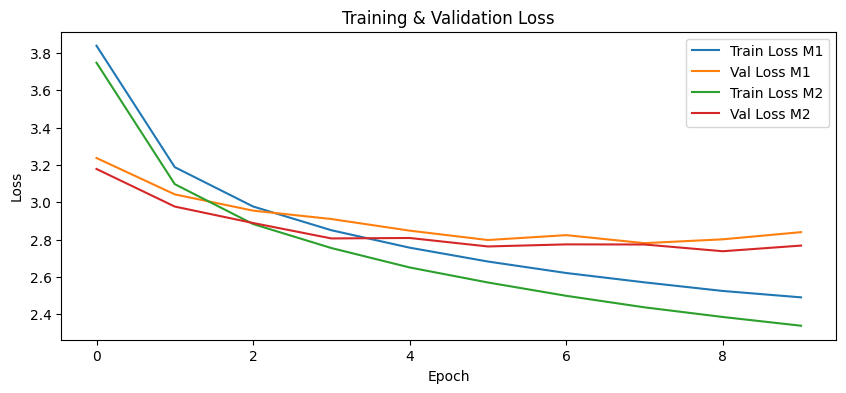

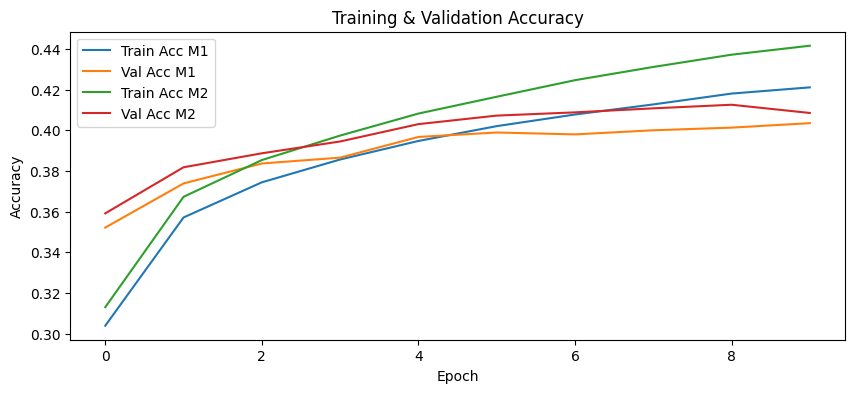

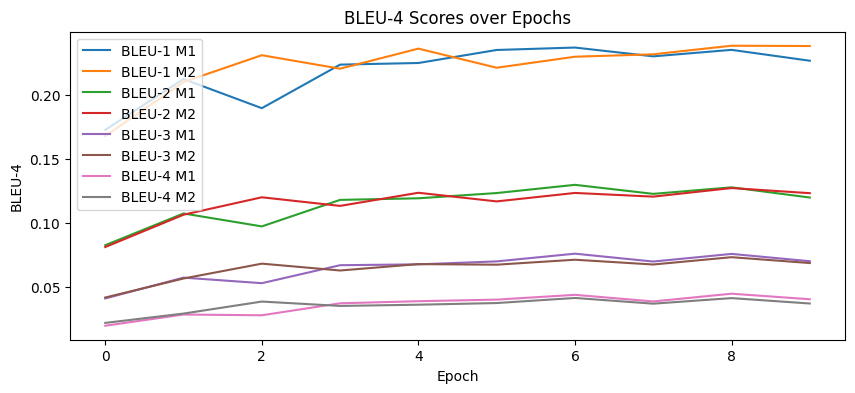

In [29]:
# Loss curves
plt.figure(figsize=(10,4))
plt.plot(train_losses, label="Train Loss M1")
plt.plot(val_losses, label="Val Loss M1")
plt.plot(train_losses2, label="Train Loss M2")
plt.plot(val_losses2, label="Val Loss M2")
plt.xlabel("Epoch"); plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend(); plt.show()

# Accuracy curves
plt.figure(figsize=(10,4))
plt.plot(train_accs, label="Train Acc M1")
plt.plot(val_accs, label="Val Acc M1")
plt.plot(train_accs2, label="Train Acc M2")
plt.plot(val_accs2, label="Val Acc M2")
plt.xlabel("Epoch"); plt.ylabel("Accuracy")
plt.title("Training & Validation Accuracy")
plt.legend(); plt.show()

# BLEU curves (example BLEU-4)
bleu1_m1 = [b["BLEU-1"] for b in bleu_scores]
bleu1_m2 = [b["BLEU-1"] for b in bleu_scores2]
bleu2_m1 = [b["BLEU-2"] for b in bleu_scores]
bleu2_m2 = [b["BLEU-2"] for b in bleu_scores2]
bleu3_m1 = [b["BLEU-3"] for b in bleu_scores]
bleu3_m2 = [b["BLEU-3"] for b in bleu_scores2]
bleu4_m1 = [b["BLEU-4"] for b in bleu_scores]
bleu4_m2 = [b["BLEU-4"] for b in bleu_scores2]
plt.figure(figsize=(10,4))
plt.plot(bleu1_m1, label="BLEU-1 M1")
plt.plot(bleu1_m2, label="BLEU-1 M2")
plt.plot(bleu2_m1, label="BLEU-2 M1")
plt.plot(bleu2_m2, label="BLEU-2 M2")
plt.plot(bleu3_m1, label="BLEU-3 M1")
plt.plot(bleu3_m2, label="BLEU-3 M2")
plt.plot(bleu4_m1, label="BLEU-4 M1")
plt.plot(bleu4_m2, label="BLEU-4 M2")
plt.xlabel("Epoch"); plt.ylabel("BLEU-4")
plt.title("BLEU-4 Scores over Epochs")
plt.legend(); plt.show()


Briefly summarize how this model behaved during training, where attention seemed to help or fail, and how the BLEU score compares to Model 2.


We kept the hyperparameters the same in the two models to have more consistent results. The difference between this model and the first one is the addition of the attention mechanism with 256 dimensions.  

Losses dropped steadily, with training loss decreasing from 3.75 to 2.34 and validation loss from 3.18 to about 2.77. Accuracy improved to around 44% on training and 41% on validation, showing that the model learned caption structure slightly better than Model 1. BLEU scores improved modestly, with BLEU-1 around 0.24 and BLEU-4 around 0.04, which is very similar to Model 1 and still shows limited overlap with the reference captions.  
Compared to model 1, model 2 seems to be doing similar errors and also always defaults to “a man”.   
Same with the first one we think that more training could probably lead to very slight increases but then very quickly overfit.

## Additional Task 1: Beam Search

Formulate and rationalize a hypothesis.

Carry through an experiment for testing this hypothesis.

Describe the outcome and carefully evaluate and reflect about it.

### Hypothesis 
Beam search will probably improve BLEU scores because it considers several candidate caption sequences instead of only one. Increasing the beam width too much may produce captions that are too generic.

In [37]:
import torch
import torch.nn.functional as F
import pandas as pd
import matplotlib.pyplot as plt
from nltk.translate.bleu_score import SmoothingFunction
from nltk.translate.bleu_score import corpus_bleu

In [ ]:
@torch.no_grad()
def beam_search_caption(model, encoder_out, beam_width=3, max_len=35, bos_idx=1, eos_idx=2, length_penalty=0.7):
    """
    External beam search function.
    Does not require modifying the previous model class cells.

    This function supports both:
    - Model 1: ShowAndTellCaptioner with nn.LSTM
    - Model 2: ShowAttendTellCaptioner with attention + nn.LSTMCell

    It decodes one image at a time.
    """

    model.eval()
    device = encoder_out.device

    if encoder_out.size(0) != 1:
        raise ValueError("beam_search_caption expects encoder_out for one image only, shape starting with batch size 1.")

    is_attention_model = hasattr(model, "attention")

    beams = [
        {
            "tokens": [bos_idx],
            "log_prob": 0.0,
            "hidden": None,
            "cell": None,
            "finished": False,
        }
    ]

    for _ in range(max_len):
        candidates = []

        for beam in beams:
            if beam["finished"]:
                candidates.append(beam)
                continue

            last_token = torch.tensor([beam["tokens"][-1]], device=device)

            if is_attention_model:
                # Model 2: attention model with LSTMCell
                if beam["hidden"] is None:
                    hidden = torch.zeros(1, model.lstm.hidden_size, device=device)
                    cell = torch.zeros(1, model.lstm.hidden_size, device=device)
                else:
                    hidden = beam["hidden"]
                    cell = beam["cell"]

                emb = model.embed(last_token)
                context, _ = model.attention(encoder_out, hidden)
                lstm_input = torch.cat([emb, context], dim=1)

                hidden, cell = model.lstm(lstm_input, (hidden, cell))
                logits = model.fc(hidden)

                new_hidden = hidden
                new_cell = cell

            else:
                # Model 1: Show and Tell model with standard LSTM
                emb = model.embed(last_token)
                lstm_input = torch.cat([encoder_out, emb], dim=1).unsqueeze(1)

                outputs, hidden_state = model.lstm(lstm_input, beam["hidden"])
                logits = model.fc(outputs.squeeze(1))

                new_hidden = hidden_state
                new_cell = None

            log_probs = F.log_softmax(logits, dim=1)
            top_log_probs, top_indices = log_probs.topk(beam_width, dim=1)

            for log_p, idx in zip(top_log_probs[0], top_indices[0]):
                idx = idx.item()

                candidates.append(
                    {
                        "tokens": beam["tokens"] + [idx],
                        "log_prob": beam["log_prob"] + log_p.item(),
                        "hidden": new_hidden,
                        "cell": new_cell,
                        "finished": idx == eos_idx,
                    }
                )

        def normalized_score(candidate):
            length = max(1, len(candidate["tokens"]))
            return candidate["log_prob"] / (length ** length_penalty)

        beams = sorted(candidates, key=normalized_score, reverse=True)[:beam_width]

        if all(beam["finished"] for beam in beams):
            break

    best_beam = max(beams, key=normalized_score)

    return best_beam["tokens"][1:]

In [39]:
def compute_bleu_smooth(references, hypotheses):
    """
    BLEU with smoothing.
    Smoothing is useful because BLEU-3 and BLEU-4 can become zero
    when generated captions are short or have little higher-order overlap.
    """
    smoothie = SmoothingFunction().method1

    return {
        "BLEU-1": corpus_bleu(references, hypotheses, weights=(1, 0, 0, 0), smoothing_function=smoothie),
        "BLEU-2": corpus_bleu(references, hypotheses, weights=(0.5, 0.5, 0, 0), smoothing_function=smoothie),
        "BLEU-3": corpus_bleu(references, hypotheses, weights=(1/3, 1/3, 1/3, 0), smoothing_function=smoothie),
        "BLEU-4": corpus_bleu(references, hypotheses, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothie),
    }


@torch.no_grad()
def evaluate_greedy_decoding(model, encoder, dataloader, tokenizer, device, max_len):
    model.eval()
    encoder.eval()

    hypotheses = []
    references = []

    for images, captions, lengths, image_ids, raw_caps in dataloader:
        images = images.to(device)
        encoder_out = encoder(images)

        generated = model.generate(
            encoder_out,
            max_len=max_len,
            bos_idx=tokenizer.bos_idx,
            eos_idx=tokenizer.eos_idx
        )

        for pred in generated:
            hypotheses.append(tokenizer.decode(pred).split())

        references.extend([[ref.split()] for ref in raw_caps])

    return compute_bleu_smooth(references, hypotheses), hypotheses, references


@torch.no_grad()
def evaluate_beam_search_decoding(model, encoder, dataloader, tokenizer, device, max_len, beam_width):
    model.eval()
    encoder.eval()

    hypotheses = []
    references = []

    for images, captions, lengths, image_ids, raw_caps in dataloader:
        images = images.to(device)
        encoder_out = encoder(images)

        for i in range(encoder_out.size(0)):
            single_encoder_out = encoder_out[i:i+1]

            generated = beam_search_caption(
                model=model,
                encoder_out=single_encoder_out,
                beam_width=beam_width,
                max_len=max_len,
                bos_idx=tokenizer.bos_idx,
                eos_idx=tokenizer.eos_idx,
                length_penalty=0.7
            )

            hypotheses.append(tokenizer.decode(generated).split())

        references.extend([[ref.split()] for ref in raw_caps])

    return compute_bleu_smooth(references, hypotheses), hypotheses, references

In [41]:
model_to_test = captioner2
encoder_to_test = encoder2
model_name = "Model 2"

results = {}

greedy_bleu, greedy_hyps, greedy_refs = evaluate_greedy_decoding(
    model=model_to_test,
    encoder=encoder_to_test,
    dataloader=test_loader,
    tokenizer=tokenizer,
    device=DEVICE,
    max_len=MAX_LEN
)

results["Greedy"] = greedy_bleu

for beam_width in [2, 3, 5]:
    beam_bleu, beam_hyps, beam_refs = evaluate_beam_search_decoding(
        model=model_to_test,
        encoder=encoder_to_test,
        dataloader=test_loader,
        tokenizer=tokenizer,
        device=DEVICE,
        max_len=MAX_LEN,
        beam_width=beam_width
    )

    results[f"Beam width {beam_width}"] = beam_bleu

results_df = pd.DataFrame(results).T
print(model_name)
display(results_df)

Model 2


,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.242186,0.130066,0.072590,0.041485
Beam width 2,0.238469,0.129181,0.074875,0.046078
Beam width 3,0.233348,0.126348,0.072577,0.042843
Beam width 5,0.229687,0.122834,0.070949,0.042339


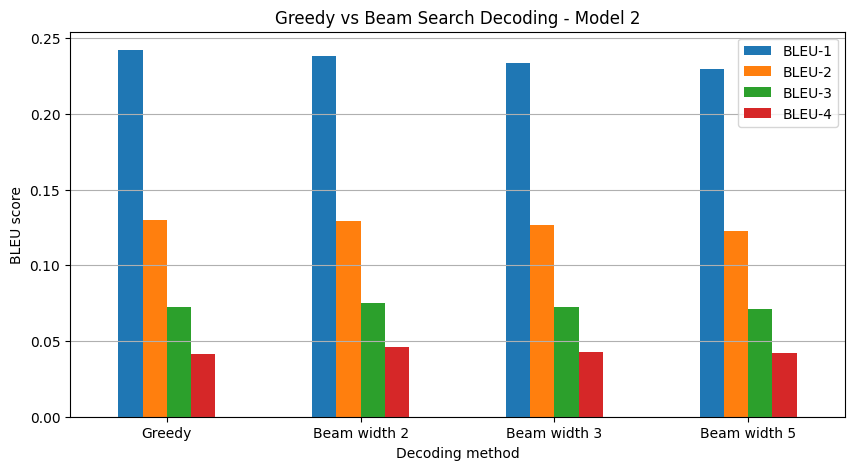

In [42]:
results_df.plot(kind="bar", figsize=(10, 5))
plt.title(f"Greedy vs Beam Search Decoding - {model_name}")
plt.ylabel("BLEU score")
plt.xlabel("Decoding method")
plt.xticks(rotation=0)
plt.grid(axis="y")
plt.show()

### Conclusion  
The hypotesis was confirmed as beam 2 achieved results better results for BLEU-3 and BLEU-4 but the greedy approach has still the best results for BLEU-1 and BLEU-2. Increasing the beam width gets progressively worse results as beam 3 has very similar results to greedy for BLEU-3 and BLEU-4 and beam 5 has all worse results.

## Additional Task 2: Attention Visualization

Formulate and rationalize a hypothesis.

Carry through an experiment for testing this hypothesis.

Describe the outcome and carefully evaluate and reflect about it.

### Hypothesis
The ragions more relevant to the generated words will probably be given more attention. For example for words involving humans like "man" or "child", we expect the human subject of the photo to be given more attention, and for words more oriented to the scene the attention will probably more spread.

In [43]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import math

In [44]:
@torch.no_grad()
def generate_caption_with_attention(model, encoder_out, tokenizer, max_len=35):
    """
    Generate a caption using greedy decoding and store the attention weights
    for each generated word.

    This function does not modify the model class.
    It assumes model is the attention captioner: captioner2.
    """

    model.eval()

    if encoder_out.dim() != 3:
        raise ValueError(
            f"Expected encoder_out to have shape (B, num_pixels, encoder_dim), "
            f"but got {tuple(encoder_out.shape)}. "
            "This usually means encoder2 is not using ShowAttendTellEncoder."
        )

    batch_size = encoder_out.size(0)

    if batch_size != 1:
        raise ValueError("This function visualizes one image at a time. Use encoder_out[i:i+1].")

    device = encoder_out.device

    hidden = torch.zeros(batch_size, model.lstm.hidden_size, device=device)
    cell = torch.zeros(batch_size, model.lstm.hidden_size, device=device)

    current_token = torch.tensor([tokenizer.bos_idx], device=device)

    generated_tokens = []
    attention_weights = []

    for _ in range(max_len):
        emb = model.embed(current_token)

        context, alpha = model.attention(encoder_out, hidden)

        lstm_input = torch.cat([emb, context], dim=1)
        hidden, cell = model.lstm(lstm_input, (hidden, cell))

        logits = model.fc(model.dropout(hidden))
        predicted_token = logits.argmax(dim=1)

        token_id = predicted_token.item()

        generated_tokens.append(token_id)
        attention_weights.append(alpha.squeeze(0).detach().cpu())

        if token_id == tokenizer.eos_idx:
            break

        current_token = predicted_token

    return generated_tokens, attention_weights

In [45]:
def token_to_word(tokenizer, token_id):
    """
    Converts one token id to a word.
    Uses tokenizer.decode if available.
    """
    try:
        word = tokenizer.decode([token_id])
    except Exception:
        word = str(token_id)

    return word.replace("<bos>", "").replace("<eos>", "").replace("<pad>", "").strip()


def decode_tokens_clean(tokenizer, tokens):
    """
    Decode generated tokens into a clean caption string.
    """
    words = []

    for token_id in tokens:
        if token_id in [tokenizer.bos_idx, tokenizer.eos_idx, tokenizer.pad_idx]:
            continue

        word = token_to_word(tokenizer, token_id)

        if word:
            words.append(word)

    return " ".join(words)


def get_attention_grid_size(alpha):
    """
    Infer the spatial grid size from the attention vector.
    Example: 49 -> 7 x 7.
    """
    num_pixels = alpha.numel()
    grid_size = int(math.sqrt(num_pixels))

    if grid_size * grid_size != num_pixels:
        raise ValueError(
            f"Attention length {num_pixels} is not a perfect square, "
            "so it cannot be reshaped into a square heatmap."
        )

    return grid_size

In [51]:
def visualize_attention_for_image_grid(
    model,
    encoder,
    dataloader,
    tokenizer,
    device,
    image_index=0,
    selected_words=None,
    max_len=35,
    max_words_to_show=7,
    ncols=4
):
    """
    Visualizes the original image and attention heatmaps in a grid.

    The first panel is the original image.
    The remaining panels are attention maps for selected generated words.
    """

    model.eval()
    encoder.eval()

    images, captions, lengths, image_ids, raw_caps = next(iter(dataloader))

    if image_index >= images.size(0):
        raise ValueError(f"image_index must be less than batch size {images.size(0)}")

    image = images[image_index:image_index+1].to(device)
    encoder_out = encoder(image)

    generated_tokens, attention_weights = generate_caption_with_attention(
        model=model,
        encoder_out=encoder_out,
        tokenizer=tokenizer,
        max_len=max_len
    )

    generated_caption = decode_tokens_clean(tokenizer, generated_tokens)

    print("Reference caption:")
    print(raw_caps[image_index])
    print()
    print("Generated caption:")
    print(generated_caption)
    print()

    # Denormalize image for visualization
    image_for_plot = denormalize_image(images[image_index].cpu())
    image_for_plot = image_for_plot.permute(1, 2, 0).numpy()

    # Pair generated words with their attention maps
    filtered_items = []

    for token_id, alpha in zip(generated_tokens, attention_weights):
        if token_id in [tokenizer.bos_idx, tokenizer.eos_idx, tokenizer.pad_idx]:
            continue

        word = token_to_word(tokenizer, token_id)

        if word:
            filtered_items.append((word, alpha))

    # Choose words to visualize
    if selected_words is not None:
        selected_words_lower = [w.lower() for w in selected_words]
        items_to_show = [
            (word, alpha)
            for word, alpha in filtered_items
            if word.lower() in selected_words_lower
        ]
    else:
        stopwords = {
            "a", "an", "the", "on", "in", "at", "of", "with", "and",
            "is", "are", "to", "for", "near", "next", "by"
        }

        items_to_show = [
            (word, alpha)
            for word, alpha in filtered_items
            if word.lower() not in stopwords
        ]

    items_to_show = items_to_show[:max_words_to_show]

    if len(items_to_show) == 0:
        print("No selected words were found in the generated caption.")
        print("Try selected_words=None or choose words that appear in the generated caption.")
        return

    # First panel is original image
    total_panels = 1 + len(items_to_show)
    nrows = math.ceil(total_panels / ncols)

    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(4 * ncols, 4 * nrows)
    )

    axes = axes.flatten() if total_panels > 1 else [axes]

    # Plot original image
    axes[0].imshow(image_for_plot)
    axes[0].axis("off")
    axes[0].set_title("Original image")

    # Plot attention maps
    for plot_idx, (word, alpha) in enumerate(items_to_show, start=1):
        grid_size = get_attention_grid_size(alpha)

        attention_map = alpha.view(1, 1, grid_size, grid_size)
        attention_map = F.interpolate(
            attention_map,
            size=(image_for_plot.shape[0], image_for_plot.shape[1]),
            mode="bilinear",
            align_corners=False
        )

        attention_map = attention_map.squeeze().numpy()

        axes[plot_idx].imshow(image_for_plot)
        axes[plot_idx].imshow(attention_map, alpha=0.5, cmap="jet")
        axes[plot_idx].axis("off")
        axes[plot_idx].set_title(f"'{word}'")

    # Hide empty grid cells
    for empty_idx in range(total_panels, len(axes)):
        axes[empty_idx].axis("off")

    plt.suptitle("Attention maps for generated words", fontsize=16)
    plt.tight_layout()
    plt.show()

Reference caption:
Smiling boy in white shirt and blue jeans in front of rock wall with man in overalls behind him .

Generated caption:
a man in a blue shirt is standing on a sidewalk



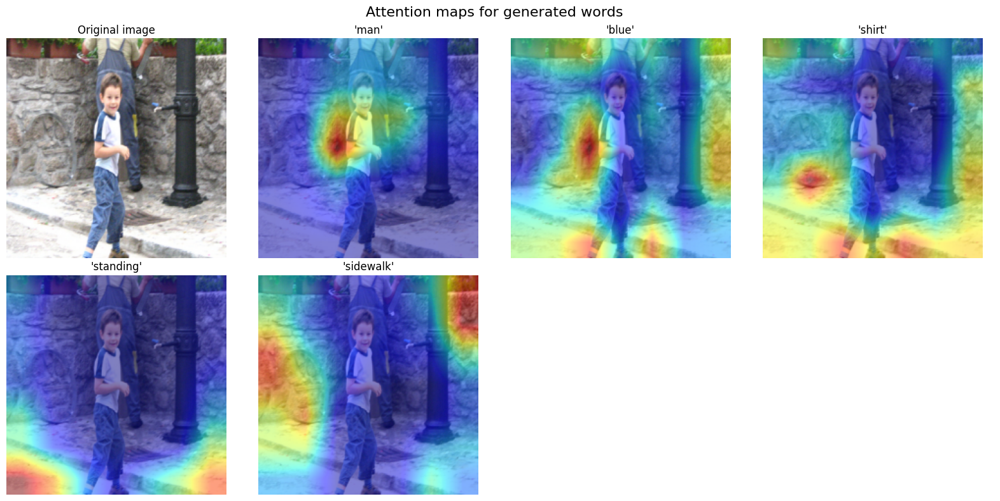

Reference caption:
Smiling boy in white shirt and blue jeans in front of rock wall with man in overalls behind him .

Generated caption:
a man in a blue shirt is standing on a sidewalk



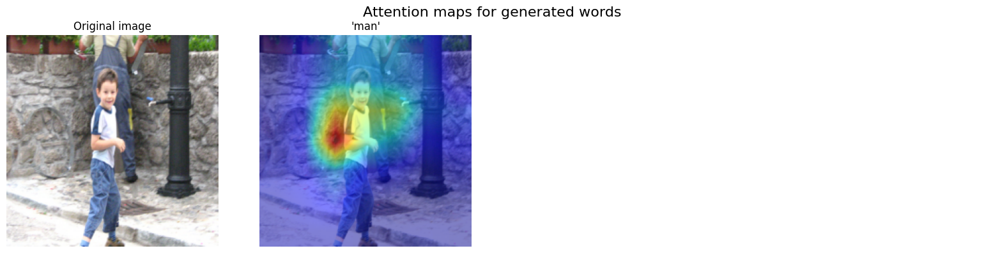

In [ ]:
visualize_attention_for_image_grid(
    model=captioner2,
    encoder=encoder2,
    dataloader=test_loader,
    tokenizer=tokenizer,
    device=DEVICE,
    image_index=0,
    selected_words=None,
    max_len=MAX_LEN,
    max_words_to_show=7,
    ncols=4
)

visualize_attention_for_image_grid(
    model=captioner2,
    encoder=encoder2,
    dataloader=test_loader,
    tokenizer=tokenizer,
    device=DEVICE,
    image_index=0,
    selected_words=["man"],
    max_len=MAX_LEN,
    max_words_to_show=6,
    ncols=4
)

Reference caption:
A boy smiles in front of a stony wall in a city .

Generated caption:
a man in a blue shirt is standing on a sidewalk



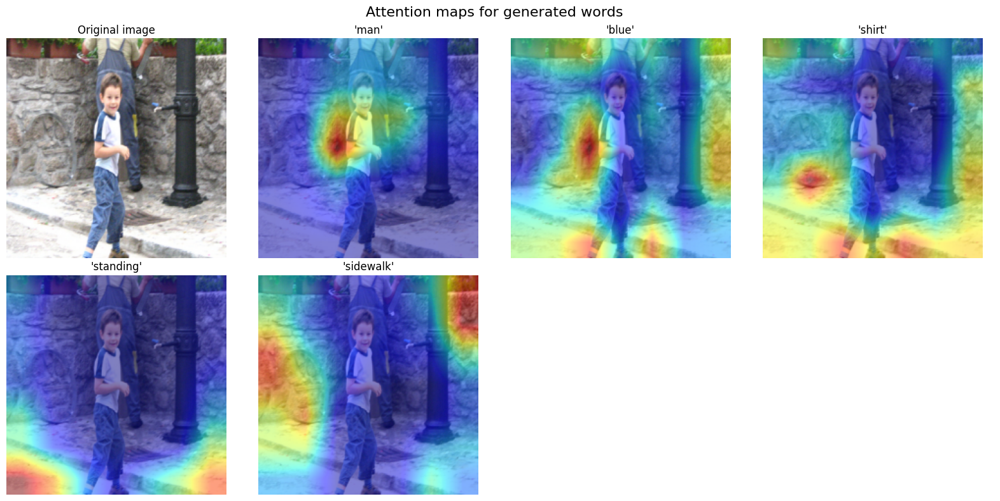

Reference caption:
A young boy waves his hand at the duck in the water surrounded by a green park .

Generated caption:
a man is standing on a dock into the water



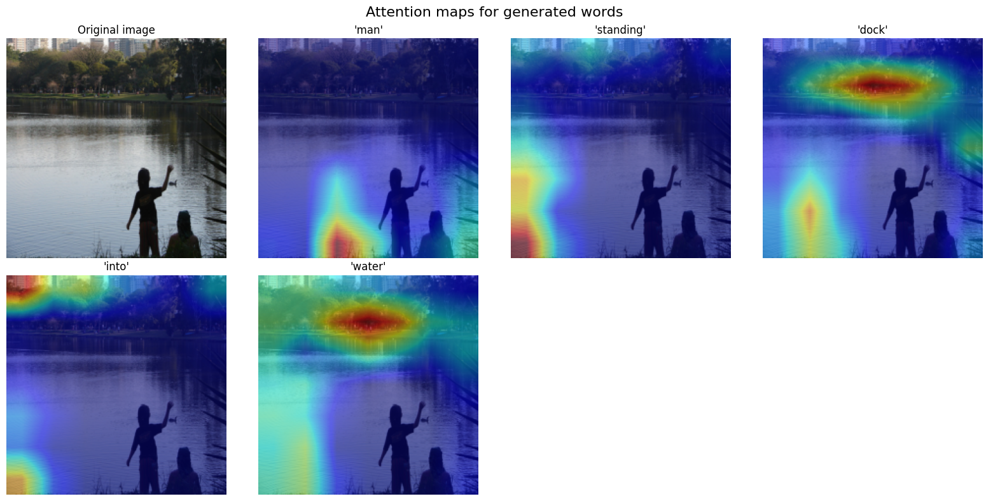

Reference caption:
An ice climber scaling a frozen waterfall .

Generated caption:
a man in a red jacket is skiing in a snow slope



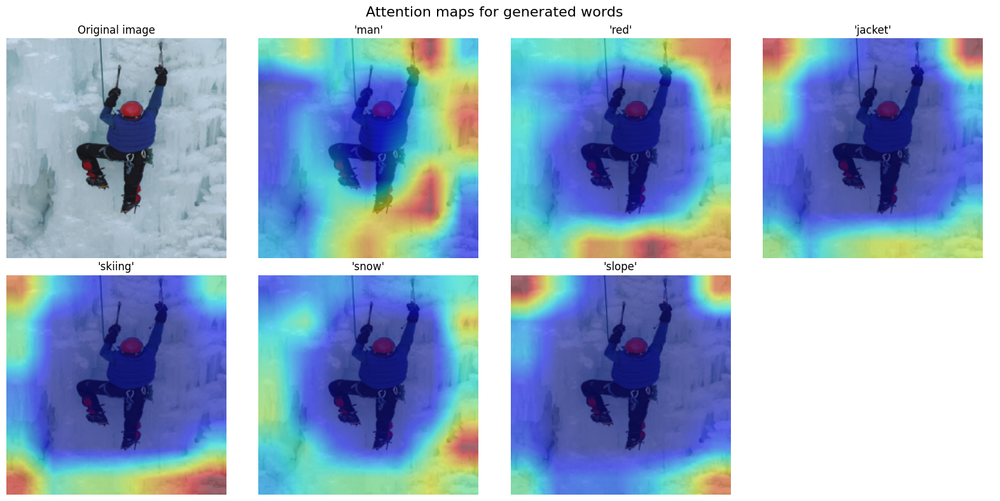

In [53]:
for idx in range(3):
    visualize_attention_for_image_grid(
        model=captioner2,
        encoder=encoder2,
        dataloader=test_loader,
        tokenizer=tokenizer,
        device=DEVICE,
        image_index=idx,
        selected_words=None,
        max_len=MAX_LEN,
        max_words_to_show=7,
        ncols=4
    )

### Conclusions
The accuracy of the attention seems to vary depending by the word. For example the attentions for the word "man" and "blue" seem to be accuarte in first image of the child, but in the same image for the word "shirt" the attention is completely off. In the other two images the attention is off even for the word "man". For the second image of the lake, the attention for "water" is completely off but for "dock" it could be understandable. For the last image of the ice climber the attention seems to be almost always to be around the man independent of the word, even when the word is "man", "red" or "jacket" which should be directly on the climber.  
Looking at these attention maps we could say that the model somewhat learned some visual grounding, but the attention remains spread rather than focused on the object of the generated word.